### Intro
The data set for audio tagging 2019 is designed with label noise. This notebook is to explore the basic information, the audio features of three subsets.

Thanks to below kagglers, some functions are re-orgnized here. Wish this notebook could be helpful.

ref:
* https://www.kaggle.com/maxwell110/explore-multi-labeled-data
* https://www.kaggle.com/dude431/beginner-s-visualization-and-removing-uniformative

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import IPython.display as ipd
import librosa

### 1. Basic information
Basic information about the data set, such as head of data, numbers, label distributions and so on.

In [2]:
# Input data files are available in the "../input/" directory.
import os
print(os.listdir("../dcase2019-data/task2"))
# !ls ../input/

['sample_submission.csv', 'test', 'train_noisy.csv', 'train_curated.csv', 'train_noisy', 'train_curated']


In [3]:
train = pd.read_csv("../dcase2019-data/task2/train_curated.csv")
train['is_curated'] = True
train_noisy = pd.read_csv("../dcase2019-data/task2/train_noisy.csv")
train_noisy['is_curated'] = False
train = pd.concat([train, train_noisy], axis=0)
del train_noisy
# print(train.head())
# print(train.tail())

In [4]:
train.head()

,fname,labels,is_curated
0,0006ae4e.wav,Bark,True
1,0019ef41.wav,Raindrop,True
2,001ec0ad.wav,Finger_snapping,True
3,0026c7cb.wav,Run,True
4,0026f116.wav,Finger_snapping,True


In [5]:
train.tail()

,fname,labels,is_curated
19810,fffc7128.wav,Accordion,False
19811,fffcf57b.wav,Acoustic_guitar,False
19812,fffd1871.wav,"Water_tap_and_faucet,Sink_(filling_or_washing)",False
19813,fffe9808.wav,Clapping,False
19814,ffff6da3.wav,Walk_and_footsteps,False


In [6]:
train['n_label'] = train.labels.str.split(',').apply(lambda x: len(x))
print(train.head(10))
print(train.tail(6))
print("Number of train examples: ", train.shape[0])
print("In curated subset: ", train[train.is_curated == True].shape[0])
print("In noisy subset: ", train[train.is_curated == False].shape[0])
# print("Number of classes:", len(set(train.labels)))

          fname                 labels  is_curated  n_label
0  0006ae4e.wav                   Bark        True        1
1  0019ef41.wav               Raindrop        True        1
2  001ec0ad.wav        Finger_snapping        True        1
3  0026c7cb.wav                    Run        True        1
4  0026f116.wav        Finger_snapping        True        1
5  003be5db.wav             Whispering        True        1
6  0041de6b.wav  Acoustic_guitar,Strum        True        2
7  004ca909.wav                 Hi-hat        True        1
8  00713ec2.wav              Bass_drum        True        1
9  0073825a.wav         Crowd,Cheering        True        2
              fname                                          labels  \
19809  fffbac14.wav                           Strum,Electric_guitar   
19810  fffc7128.wav                                       Accordion   
19811  fffcf57b.wav                                 Acoustic_guitar   
19812  fffd1871.wav  Water_tap_and_faucet,Sink_(filling_

In [7]:
test = pd.read_csv("../dcase2019-data/task2/sample_submission.csv")
# print(test.head())
test.head()

,fname,Accelerating_and_revving_and_vroom,Accordion,Acoustic_guitar,Applause,Bark,Bass_drum,Bass_guitar,Bathtub_(filling_or_washing),Bicycle_bell,...,Toilet_flush,Traffic_noise_and_roadway_noise,Trickle_and_dribble,Walk_and_footsteps,Water_tap_and_faucet,Waves_and_surf,Whispering,Writing,Yell,Zipper_(clothing)
0,000ccb97.wav,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0012633b.wav,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,001ed5f1.wav,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,00294be0.wav,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,003fde7a.wav,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [8]:
print("Number of test examples: ", test.shape[0],
      "\nNumber of classes: ", len(set(test.columns[1:])))
print(set(test.columns[1:]))

Number of test examples:  1120 
Number of classes:  80
{'Stream', 'Meow', 'Writing', 'Walk_and_footsteps', 'Applause', 'Chewing_and_mastication', 'Burping_and_eructation', 'Fart', 'Accordion', 'Drawer_open_or_close', 'Female_speech_and_woman_speaking', 'Drip', 'Skateboard', 'Knock', 'Sigh', 'Sneeze', 'Toilet_flush', 'Mechanical_fan', 'Accelerating_and_revving_and_vroom', 'Traffic_noise_and_roadway_noise', 'Bass_drum', 'Scissors', 'Shatter', 'Buzz', 'Raindrop', 'Purr', 'Harmonica', 'Microwave_oven', 'Tick-tock', 'Whispering', 'Glockenspiel', 'Printer', 'Zipper_(clothing)', 'Frying_(food)', 'Female_singing', 'Crowd', 'Bass_guitar', 'Fill_(with_liquid)', 'Car_passing_by', 'Bark', 'Run', 'Slam', 'Computer_keyboard', 'Yell', 'Tap', 'Cricket', 'Strum', 'Child_speech_and_kid_speaking', 'Finger_snapping', 'Clapping', 'Cheering', 'Waves_and_surf', 'Dishes_and_pots_and_pans', 'Marimba_and_xylophone', 'Sink_(filling_or_washing)', 'Chink_and_clink', 'Bicycle_bell', 'Gasp', 'Male_singing', 'Water_t

### Audio duration

It's introduced that durations of samples in curated subset are from 0.3s to 30s, while those in noisy subset are from 1s to 15s, with the vast majority lasting 15s.

In [9]:
import wave
SAMPLE_RATE = 44100

train_1 = train[train.is_curated == True].sort_values('labels').reset_index()
train_1['nframes'] = train_1['fname'].apply(lambda f: 
    wave.open('../dcase2019-data/task2/train_curated/' + f).getnframes()/SAMPLE_RATE)
train_1.head()


,index,fname,labels,is_curated,n_label,nframes
0,1064,378c1422.wav,Accelerating_and_revving_and_vroom,True,1,4.265125
1,334,11a4677f.wav,Accelerating_and_revving_and_vroom,True,1,20.662857
2,1433,4addd0bc.wav,Accelerating_and_revving_and_vroom,True,1,12.312404
3,3077,9fb6e634.wav,Accelerating_and_revving_and_vroom,True,1,4.615397
4,230,0c2c5c75.wav,Accelerating_and_revving_and_vroom,True,1,11.969887


In [10]:
train_2 = train[train.is_curated == False].sort_values('labels').reset_index()
train_2['nframes'] = train_2['fname'].apply(lambda f: 
    wave.open('../dcase2019-data/task2/train_noisy/' + f).getnframes()/SAMPLE_RATE)
train_2.head()

,index,fname,labels,is_curated,n_label,nframes
0,2035,1a22a28d.wav,Accelerating_and_revving_and_vroom,False,1,15.000000
1,19294,f90b1103.wav,Accelerating_and_revving_and_vroom,False,1,15.650249
2,5413,45d027cb.wav,Accelerating_and_revving_and_vroom,False,1,15.000000
3,5433,4604bbc5.wav,Accelerating_and_revving_and_vroom,False,1,15.000000
4,1106,0e2415bd.wav,Accelerating_and_revving_and_vroom,False,1,15.000000


In [11]:
test_new = test
test_new['nframes'] = test_new['fname'].apply(lambda f: 
    wave.open('../dcase2019-data/task2/test/' + f).getnframes()/SAMPLE_RATE)
test_new.head()

,fname,Accelerating_and_revving_and_vroom,Accordion,Acoustic_guitar,Applause,Bark,Bass_drum,Bass_guitar,Bathtub_(filling_or_washing),Bicycle_bell,...,Traffic_noise_and_roadway_noise,Trickle_and_dribble,Walk_and_footsteps,Water_tap_and_faucet,Waves_and_surf,Whispering,Writing,Yell,Zipper_(clothing),nframes
0,000ccb97.wav,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.40
1,0012633b.wav,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,16.06
2,001ed5f1.wav,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,4.72
3,00294be0.wav,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,19.00
4,003fde7a.wav,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,22.88


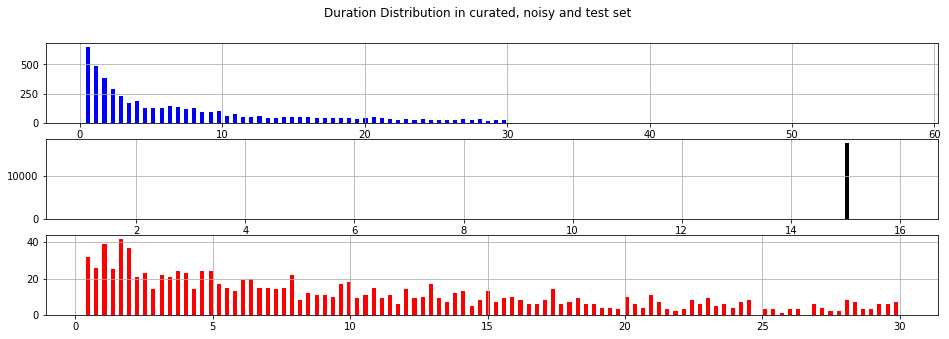

In [12]:
import matplotlib.pyplot as plt
%matplotlib inline

fig, axes = plt.subplots(3, 1, figsize=(16,5))
train_1.nframes.hist(bins=100, grid=True, rwidth=0.5, color='blue', ax=axes[0])
train_2.nframes.hist(bins=100, grid=True, rwidth=0.5, color='black', ax=axes[1])
test_new.nframes.hist(bins=100, grid=True, rwidth=0.5, color='red', ax=axes[2])
plt.suptitle('Duration Distribution in curated, noisy and test set', ha='center', fontsize='large');

Majority of the audio files are short than 10s, when we crop audio as cnn train data, 4-8 seconds should be OK.

There are an abnormal length in the train histogram.

In [13]:
train_1.query("nframes > 30")

,index,fname,labels,is_curated,n_label,nframes
4240,2316,77b925c2.wav,Stream,True,1,57.571179


In [14]:
ipd.Audio( '../dcase2019-data/task2/train_curated/' + '77b925c2.wav')

In [15]:
del train_1
del train_2
del test_new

### Train set labels distributions:
Samples in curated subset have 1, 2, 3, 4, 6 labels, while samples in noisy subset have 1, 2, 3, 4, 5, 6, 7 labels. Most samples have a single label.

In [16]:
train.query('is_curated == True').n_label.value_counts()

1    4269
2     627
3      69
4       4
6       1
Name: n_label, dtype: int64

In [17]:
train.query('is_curated == False').n_label.value_counts()

1    16566
2     2558
3      504
4      141
5       38
7        4
6        4
Name: n_label, dtype: int64

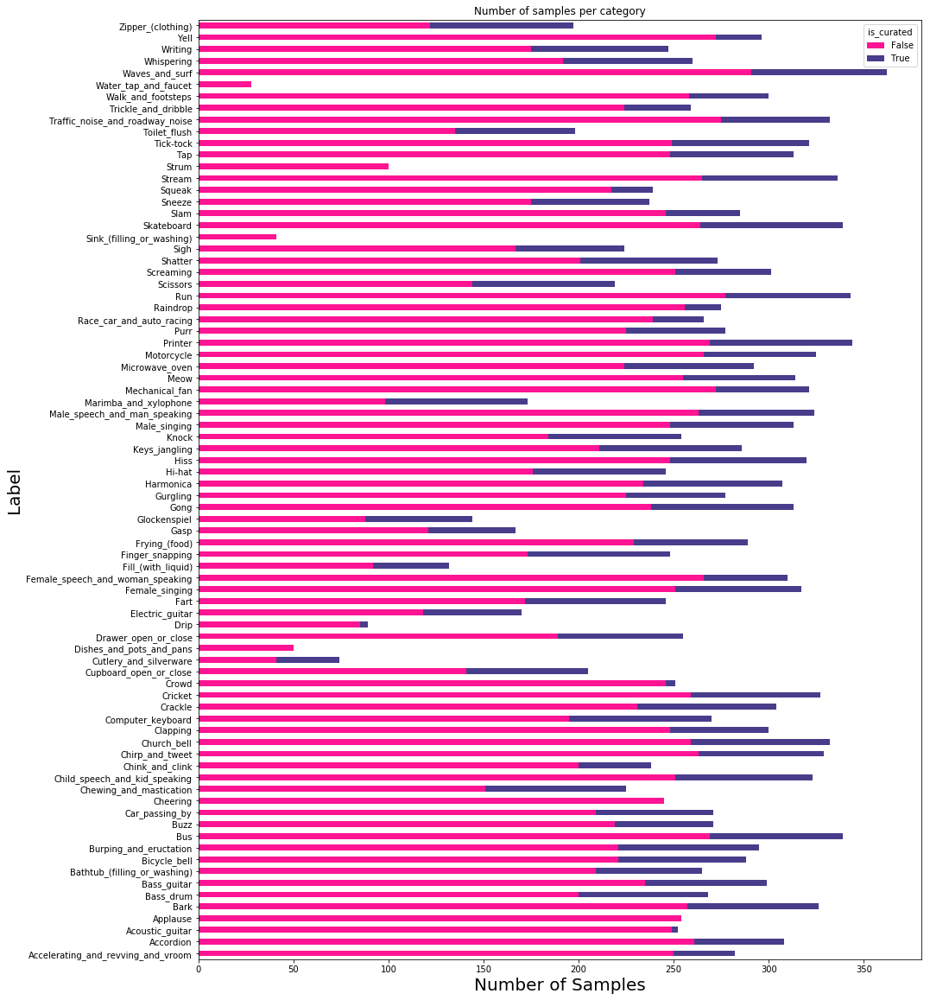

In [18]:
cat_gp = train[train.n_label == 1].groupby(
    ['labels', 'is_curated']).agg({'fname':'count'}).reset_index()
cat_gpp = cat_gp.pivot(index='labels', columns='is_curated', values='fname').reset_index().set_index('labels')

plot = cat_gpp.plot(
    kind='barh',
    title="Number of samples per category",
    stacked=True,
    color=['deeppink', 'darkslateblue'],
    figsize=(15,20))
plot.set_xlabel("Number of Samples", fontsize=20)
plot.set_ylabel("Label", fontsize=20);

#### Wordcloud for labels

In [19]:
from wordcloud import WordCloud
wordcloud = WordCloud(max_font_size=50, width=600, height=300).generate(' '.join(train.labels))
plt.figure(figsize=(15,8))
plt.imshow(wordcloud)
plt.title("Wordcloud for Labels", fontsize=35)
plt.axis("off")
plt.show() 

ModuleNotFoundError: No module named 'wordcloud'

### Audio features
Try to listen samples of specific label, check waveform and spectrogram together.

In [42]:
import librosa, librosa.display
import matplotlib.pyplot as plt
import os
import IPython
SAMPLE_RATE = 44100

def load_and_show(path, fname):
    plt.figure(figsize=(10,3))
    wav, sr = librosa.core.load(os.path.join(path, fname))
#     melspec = librosa.feature.melspectrogram(
#         librosa.resample(wav, sr, SAMPLE_RATE),
#         sr=SAMPLE_RATE/2, n_fft = 1024,
#         hop_length=512, n_mels= 128
#     )
#     logmel = librosa.core.power_to_db(melspec)
    D = librosa.amplitude_to_db(np.abs(librosa.stft(wav)), ref=np.max)
    # https://www.kaggle.com/c/freesound-audio-tagging-2019/discussion/91827#latest-529419
#     D = librosa.pcen(np.abs(librosa.stft(wav)))
    # CQT = librosa.amplitude_to_db(np.abs(librosa.cqt(y, sr=sr)), ref=np.max)
    plt.subplot(1,2,1)
    librosa.display.waveplot(wav, sr=SAMPLE_RATE)
    plt.subplot(1,2,2)
    librosa.display.specshow(D, sr=SAMPLE_RATE, x_axis='time', y_axis='linear')
    plt.title(os.path.join(path, fname))

In [1]:
# # sampling an audio in train_curated
# # choose a label randomly
# samp = train[(train.n_label == 1) & (train.is_curated == True)].sample(1)
# specific_label = samp.labels.values[0]

# # for the specific label, choose several samples
# samples = train[(train.n_label == 1) 
#                & (train.is_curated == True) 
#                & (train.labels == specific_label)].sample(5)

# # Listen and check the wave, spectrogram of the samples.
# print('Label:', specific_label)
# for fname in list(samples.fname):
# #     print('../input/train_curated/{}'.format(fname))
#     load_and_show('../dcase2019-data/task2/train_curated', fname)
#     IPython.display.display(ipd.Audio('../dcase2019-data/task2/train_curated/{}'.format(fname)))


In [2]:
# sampling an audio in train_noisy
# for the specific label, choose several samples
samples = train[(train.n_label == 1) 
               & (train.is_curated == False) 
               & (train.labels == specific_label)].sample(5)

# Listen and check the wave, spectrogram of the samples.
print('Label:', specific_label)
for fname in list(samples.fname):
    print('../dcase2019-data/task2/train_noisy/{}'.format(fname))
    load_and_show('../dcase2019-data/task2/train_noisy', fname)
    IPython.display.display(ipd.Audio('../dcase2019-data/task2/train_noisy/{}'.format(fname)))

NameError: name 'train' is not defined

We can try some different labels, it seems a lot of noisy data have wrong labels.

To let the noisy data make positive effect, designed loss function or semi-supervised learning should be used.

### Multi labels

About 1/5 of samples in curated and noisy subset are with multi labels, so let's check the samples with multi labels.

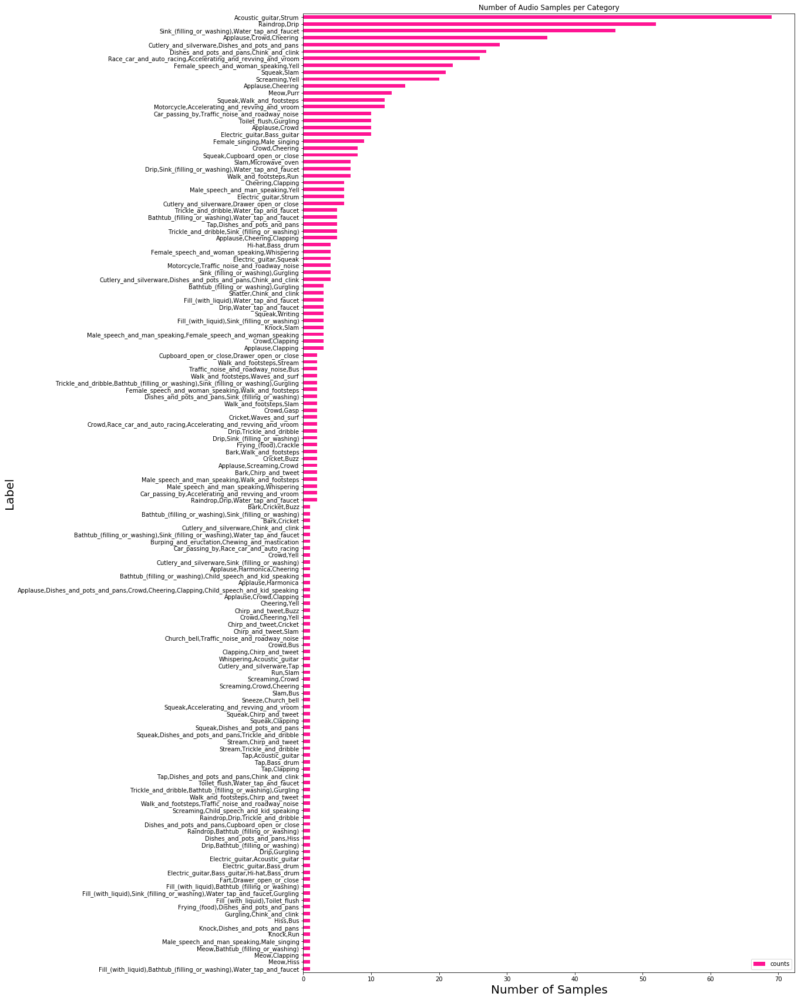

In [45]:
cat_gp = train[(train.n_label > 1) & (train.is_curated == True)].groupby('labels').agg({'fname':'count'})
cat_gp.columns = ['counts']

plot = cat_gp.sort_values(ascending=True, by='counts').plot(
    kind='barh',
    title="Number of Audio Samples per Category",
    color='deeppink',
    figsize=(15,30))
plot.set_xlabel("Number of Samples", fontsize=20)
plot.set_ylabel("Label", fontsize=20);

There are only about 10 kinds of multi labels whose samples are more than 10.

#### 2 label conditions

Cutlery_and_silverware,Sink_(filling_or_washing)


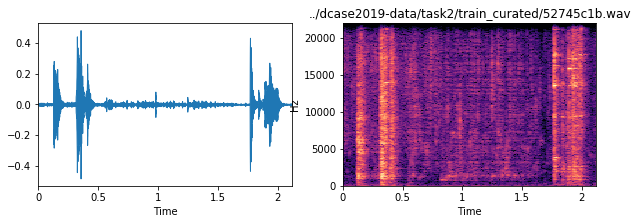

In [46]:
label_set = set(train.loc[(train.n_label == 2) & (train.is_curated == True), 'labels']) & set(
    train.loc[(train.n_label == 2) & (train.is_curated == False), 'labels'])

label_samp = np.random.choice(list(label_set), 1)[0]
samp = train[(train.labels == label_samp) & (train.is_curated == True)].sample(1)
print(label_samp)
IPython.display.display(ipd.Audio('../dcase2019-data/task2/train_curated/{}'.format(samp.fname.values[0])))
load_and_show('../dcase2019-data/task2/train_curated', samp.fname.values[0])

Cutlery_and_silverware,Sink_(filling_or_washing)


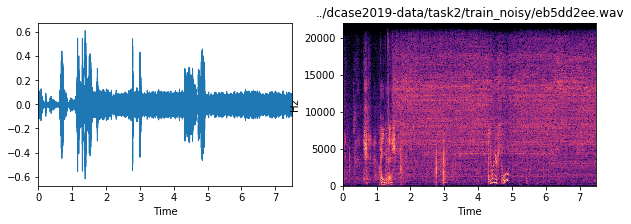

In [47]:
# sampling an audio in train_noisy
samp_n = train[(train.labels == label_samp) & (train.is_curated == False)].sample(1)
print(samp_n.labels.values[0])
IPython.display.display(ipd.Audio('../dcase2019-data/task2/train_noisy/{}'.format(samp_n.fname.values[0])))
load_and_show('../dcase2019-data/task2/train_noisy', samp_n.fname.values[0])

#### 3 labels conditions

In [48]:
label_set = set(train.loc[(train.n_label == 3) & (train.is_curated == True), 'labels']) & set(
    train.loc[(train.n_label == 3) & (train.is_curated == False), 'labels'])

label_samp = np.random.choice(list(label_set), 1)[0]
samp = train[(train.labels == label_samp) & (train.is_curated == True)].sample(1)
print('File name:', '../dcase2019-data/task2/train_curated/{}'.format(samp.fname.values[0]), '\nLabel:', label_samp)
IPython.display.display(ipd.Audio('../input/train_curated/{}'.format(samp.fname.values[0])))
load_and_show('../dcase2019-data/task2/train_curated', samp.fname.values[0])

File name: ../dcase2019-data/task2/train_curated/95c7fe22.wav 
Label: Fill_(with_liquid),Bathtub_(filling_or_washing),Water_tap_and_faucet


ValueError: could not convert string to float: '../input/train_curated/95c7fe22.wav'

File name: ../dcase2019-data/task2/train_noisy/23a16fc5.wav 
Label: Fill_(with_liquid),Bathtub_(filling_or_washing),Water_tap_and_faucet


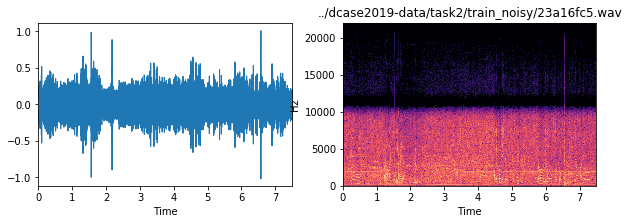

In [50]:
# sampling an audio in train_noisy
samp_n = train[(train.labels == label_samp) & (train.is_curated == False)].sample(1)
print('File name:', '../dcase2019-data/task2/train_noisy/{}'.format(samp_n.fname.values[0]), '\nLabel:', samp_n.labels.values[0])
IPython.display.display(ipd.Audio('../dcase2019-data/task2/train_noisy/{}'.format(samp_n.fname.values[0])))
load_and_show('../dcase2019-data/task2/train_noisy', samp_n.fname.values[0])

### 4 and more labels

There are no common record with same multi labels in curated and noisy. Will check audios in different subsets.

File name: ../dcase2019-data/task2/train_curated/cce07823.wav 
Label: Fill_(with_liquid),Sink_(filling_or_washing),Water_tap_and_faucet,Gurgling


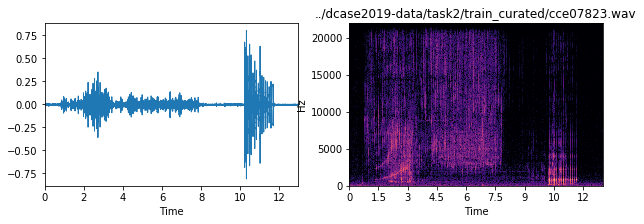

In [51]:
samp = train[(train.n_label == 4) & (train.is_curated == True)].sample(1)
print('File name:', '../dcase2019-data/task2/train_curated/{}'.format(samp.fname.values[0]), '\nLabel:', samp.labels.values[0])
IPython.display.display(ipd.Audio('../dcase2019-data/task2/train_curated/{}'.format(samp.fname.values[0])))
load_and_show('../dcase2019-data/task2/train_curated', samp.fname.values[0])

File name: ../dcase2019-data/task2/train_noisy/4f68b6fd.wav 
Label: Gasp,Skateboard,Sigh,Gurgling


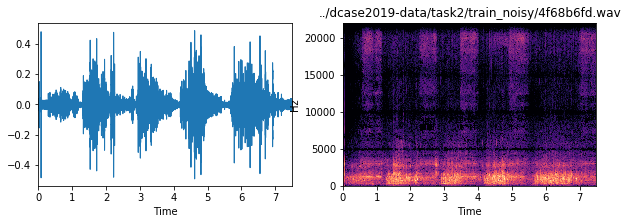

In [52]:
samp = train[(train.n_label == 4) & (train.is_curated == False)].sample(1)
print('File name:', '../dcase2019-data/task2/train_noisy/{}'.format(samp.fname.values[0]), '\nLabel:', samp.labels.values[0])
IPython.display.display(ipd.Audio('../dcase2019-data/task2/train_noisy/{}'.format(samp.fname.values[0])))
load_and_show('../dcase2019-data/task2/train_noisy', samp.fname.values[0])

File name: ../dcase2019-data/task2/train_noisy/2e917074.wav 
Label: Bathtub_(filling_or_washing),Child_speech_and_kid_speaking,Cutlery_and_silverware,Chink_and_clink,Knock


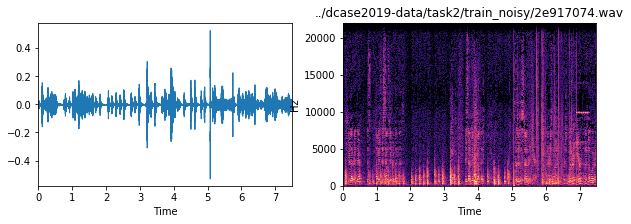

In [53]:
samp = train[(train.n_label == 5) & (train.is_curated == False)].sample(1)
print('File name:', '../dcase2019-data/task2/train_noisy/{}'.format(samp.fname.values[0]), '\nLabel:', samp.labels.values[0])
IPython.display.display(ipd.Audio('../dcase2019-data/task2/train_noisy/{}'.format(samp.fname.values[0])))
load_and_show('../dcase2019-data/task2/train_noisy', samp.fname.values[0])

File name: ../dcase2019-data/task2/train_noisy/9ccfc41d.wav 
Label: Fill_(with_liquid),Water_tap_and_faucet,Hiss,Gurgling,Toilet_flush,Sink_(filling_or_washing)


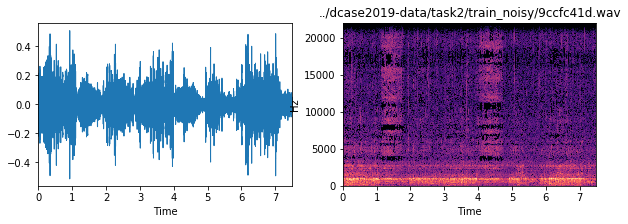

In [54]:
samp = train[(train.n_label == 6) & (train.is_curated == False)].sample(1)
print('File name:', '../dcase2019-data/task2/train_noisy/{}'.format(samp.fname.values[0]), '\nLabel:', samp.labels.values[0])
IPython.display.display(ipd.Audio('../dcase2019-data/task2/train_noisy/{}'.format(samp.fname.values[0])))
load_and_show('../dcase2019-data/task2/train_noisy', samp.fname.values[0])

Summary

* Samples with multi labels sound really difficult even for people to label all events correctly. Spectrograms of those samples maybe confused with all events happen the same time.

eg. "File name: ../input/train_noisy/5fde4352.wav Label: Fill_(with_liquid),Water_tap_and_faucet,Hiss,Toilet_flush,Sink_(filling_or_washing)"

* **A lot of noisy data seem to have wrong labels**. In the previous competition, using the robust loss function to suppress the effect of mislabeled data was one of the important points to get high score. We must care of that again.

### Co-occurrence

How to get labels for the trainning process.

ref:
* https://www.kaggle.com/maxwell110/explore-multi-labeled-data